In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")

In [43]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [44]:
print('number of unique values in col :')
for c in df.columns:
    unique = len(df[c].unique())
    if (unique <= 20):
        print('-----> CATEGORICAL -----> ', end='')
    print(c,'= ', unique)

number of unique values in col :
iso_code =  255
-----> CATEGORICAL -----> continent =  7
location =  255
date =  1421
total_cases =  136290
new_cases =  27957
new_cases_smoothed =  50199
total_deaths =  52284
new_deaths =  4655
new_deaths_smoothed =  11657
total_cases_per_million =  176454
new_cases_per_million =  83109
new_cases_smoothed_per_million =  96004
total_deaths_per_million =  104164
new_deaths_per_million =  9843
new_deaths_smoothed_per_million =  10581
reproduction_rate =  381
icu_patients =  4097
icu_patients_per_million =  13207
hosp_patients =  10273
hosp_patients_per_million =  25881
weekly_icu_admissions =  1671
weekly_icu_admissions_per_million =  4349
weekly_hosp_admissions =  8133
weekly_hosp_admissions_per_million =  16937
total_tests =  78046
new_tests =  38684
total_tests_per_thousand =  72349
new_tests_per_thousand =  12375
new_tests_smoothed =  44393
new_tests_smoothed_per_thousand =  13003
positive_rate =  5172
tests_per_case =  7078
-----> CATEGORICAL ----->

In [45]:
df = df.drop_duplicates()

In [46]:
df['tests_units'].unique()

array([nan, 'tests performed', 'units unclear', 'samples tested',
       'people tested'], dtype=object)

In [47]:
df['iso_code']

0         AFG
1         AFG
2         AFG
3         AFG
4         AFG
         ... 
357264    ZWE
357265    ZWE
357266    ZWE
357267    ZWE
357268    ZWE
Name: iso_code, Length: 357269, dtype: object

In [48]:
df['location']

0         Afghanistan
1         Afghanistan
2         Afghanistan
3         Afghanistan
4         Afghanistan
             ...     
357264       Zimbabwe
357265       Zimbabwe
357266       Zimbabwe
357267       Zimbabwe
357268       Zimbabwe
Name: location, Length: 357269, dtype: object

In [49]:
# saving the priginal data
original_df = df.copy()

# Perform data cleaning operations
# Replace missing values with NaN
df.replace('', pd.NA, inplace=True)

# Drop unnecessary columns
# Calculate the percentage of missing values in each column
# the mean will give the proportion of True values, which represents the percentage of missing values in each column.
missing_percentages = df.isnull().mean() * 100

# Identify columns with high missing value percentages
high_missing_columns = missing_percentages[missing_percentages > 50].index.tolist()

# Identify columns with identical values
identical_columns = df.columns[df.nunique() == 1].tolist()

# Combine the lists of high missing value columns and identical value columns
unnecessary_columns = high_missing_columns + identical_columns

# Print the unnecessary columns
print("Unnecessary columns:")
print(high_missing_columns)
print(identical_columns)

Unnecessary columns:
['icu_patients', 'icu_patients_per_million', 'hosp_patients', 'hosp_patients_per_million', 'weekly_icu_admissions', 'weekly_icu_admissions_per_million', 'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_boosters', 'new_vaccinations', 'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred', 'extreme_poverty', 'handwashing_facilities', 'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative', 'excess_mortality', 'excess_mortality_cumulative_per_million']
[]


In [50]:
columns_to_drop = unnecessary_columns
df.drop(columns=columns_to_drop, inplace=True)

# Convert date column to datetime format
df['date'] = pd.to_datetime(df['date'])

# Reset the index
df.reset_index(drop=True, inplace=True)

In [51]:
# saving a opy of our data in case we want to go back to this step
df_after_col_dropping = df.copy()

In [52]:
original_df.shape

(357269, 67)

In [53]:
df_after_col_dropping.shape

(357269, 35)

In [54]:
for c in df.columns:
    if np.issubdtype(df[c].dtype, np.number):
        df = df[(np.abs(df[c] - df[c].mean()) / df[c].std()) < 3]  # Remove outliers

In [55]:
df.shape

(55442, 35)

In [56]:
df[df['location'] == 'Afghanistan'].shape

(0, 35)

In [57]:
# reverting the df back to the earlier step before outlier remval since it didn't work out properly
df = df_after_col_dropping
df.shape

(357269, 35)

In [58]:
from scipy import stats

def remove_outliers(df):
    # Identify numeric columns in the DataFrame
    numeric_cols = df.select_dtypes(include=np.number).columns

    # Initialize a boolean mask for outlier detection
    outliers_mask = np.zeros_like(df, dtype=bool)

    for column in numeric_cols:
        # Calculate z-scores for the current numeric column
        z_scores = np.abs(stats.zscore(df[column]))

        # Set a threshold for outlier detection
        threshold = 3

        # Identify outliers by comparing against the threshold
        outlier_indexes = np.where(z_scores > threshold)

        # Set the outliers mask for the current column
        outliers_mask[outlier_indexes, df.columns.get_loc(column)] = True

    # Remove rows containing outliers from the DataFrame
    df_cleaned = df[~np.any(outliers_mask, axis=1)]

    return df_cleaned

df_cleaned = remove_outliers(df)
df_cleaned.shape

(351593, 35)

In [59]:
df = df_cleaned

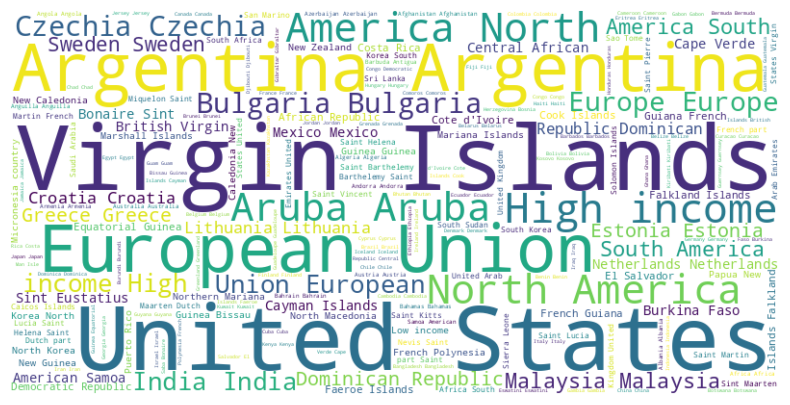

In [60]:
from wordcloud import WordCloud

# Create a string of all the country names in the DataFrame
country_names = ' '.join(df['location'])

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(country_names)

# Plot the WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [61]:
df['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'American Samoa',
       'Andorra', 'Angola', 'Anguilla', 'Antigua and Barbuda',
       'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria',
       'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados',
       'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan',
       'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'England', 'Equatorial Guinea', 'Eritrea',
       

In [62]:
df['location'].value_counts().nlargest(20)

Argentina             1420
European Union        1419
India                 1419
Malaysia              1419
Czechia               1419
High income           1419
North America         1419
Sweden                1419
Aruba                 1419
Europe                1419
Bulgaria              1419
Estonia               1418
Greece                1418
South America         1418
Lithuania             1418
Croatia               1417
Dominican Republic    1417
Netherlands           1417
Mexico                1416
Moldova               1414
Name: location, dtype: int64

In [63]:
df[df['location']=='High income']['iso_code'].unique()

array(['OWID_HIC'], dtype=object)

In [64]:
df[df['location']=='Low income']['iso_code'].unique()

array(['OWID_LIC'], dtype=object)

In [65]:
df[df['iso_code']=='OWID_LIC']['location'].unique()

array(['Low income'], dtype=object)

In [66]:
df['stringency_index'].describe()

count    197651.000000
mean         42.714021
std          24.911007
min           0.000000
25%          22.220000
50%          42.590000
75%          62.040000
max         100.000000
Name: stringency_index, dtype: float64

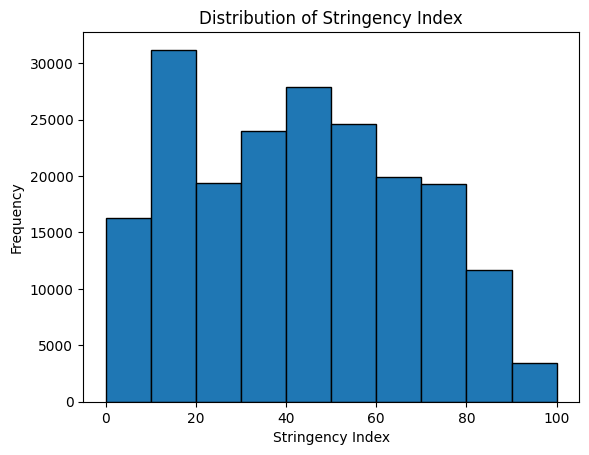

In [67]:
# Histogram
plt.hist(df['stringency_index'], bins=10, edgecolor='black')
plt.title('Distribution of Stringency Index')
plt.xlabel('Stringency Index')
plt.ylabel('Frequency')
plt.show()

In [68]:
df[df['location'] == 'Malaysia'][['stringency_index', 'median_age', 'aged_65_older', 'aged_70_older', 'cardiovasc_death_rate', 'diabetes_prevalence']].describe()

,stringency_index,median_age,aged_65_older,aged_70_older,cardiovasc_death_rate,diabetes_prevalence
count,1094.000000,1419.0,1419.000,1.419000e+03,1419.000,1.419000e+03
mean,49.286207,29.9,6.293,3.407000e+00,260.942,1.674000e+01
std,26.481168,0.0,0.000,4.442458e-16,0.000,3.553966e-15
min,0.000000,29.9,6.293,3.407000e+00,260.942,1.674000e+01
25%,19.440000,29.9,6.293,3.407000e+00,260.942,1.674000e+01
50%,54.620000,29.9,6.293,3.407000e+00,260.942,1.674000e+01
75%,73.150000,29.9,6.293,3.407000e+00,260.942,1.674000e+01
max,91.670000,29.9,6.293,3.407000e+00,260.942,1.674000e+01


In [69]:
df[df['location'] == 'Malaysia'][['hospital_beds_per_thousand', 'life_expectancy', 'human_development_index', 'population', 'female_smokers', 'male_smokers' ]].describe()

,hospital_beds_per_thousand,life_expectancy,human_development_index,population,female_smokers,male_smokers
count,1419.0,1.419000e+03,1.419000e+03,1419.0,1419.0,1.419000e+03
mean,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01
std,0.0,2.843173e-14,3.331843e-16,0.0,0.0,7.107932e-15
min,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01
25%,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01
50%,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01
75%,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01
max,1.9,7.616000e+01,8.100000e-01,33938216.0,1.0,4.240000e+01


In [70]:
df[df['location'] == 'Iran'][['stringency_index', 'median_age', 'aged_65_older', 'aged_70_older', 'cardiovasc_death_rate', 'diabetes_prevalence']].describe()

,stringency_index,median_age,aged_65_older,aged_70_older,cardiovasc_death_rate,diabetes_prevalence
count,1094.000000,1.414000e+03,1.414000e+03,1414.000,1414.000,1.414000e+03
mean,59.445210,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00
std,17.339371,7.107941e-15,1.776985e-15,0.000,0.000,1.776985e-15
min,0.000000,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00
25%,53.940000,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00
50%,59.725000,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00
75%,70.830000,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00
max,83.330000,3.240000e+01,5.440000e+00,3.182,270.308,9.590000e+00


In [71]:
df[df['location'] == 'Iran'][['hospital_beds_per_thousand', 'life_expectancy', 'human_development_index', 'population', 'female_smokers', 'male_smokers' ]].describe()

,hospital_beds_per_thousand,life_expectancy,human_development_index,population,female_smokers,male_smokers
count,1414.0,1.414000e+03,1.414000e+03,1414.0,1.414000e+03,1.414000e+03
mean,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01
std,0.0,1.421588e-14,1.110616e-16,0.0,2.221232e-16,7.107941e-15
min,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01
25%,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01
50%,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01
75%,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01
max,1.5,7.668000e+01,7.830000e-01,88550568.0,8.000000e-01,2.110000e+01


this piece of code is here to identify if these columns are identical for all locations or just in Malasiya:

In [72]:
isidentical = 0
notidentical = 0
cols = ['median_age', 'aged_65_older', 'aged_70_older', 'cardiovasc_death_rate', 'diabetes_prevalence', 'hospital_beds_per_thousand', 'life_expectancy', 'human_development_index', 'population', 'female_smokers', 'male_smokers' ]
for l in df['location'].unique():
  for col in cols:
    if (df[df['location'] == l][col].nunique() != 1):
      notidentical +=1
    else:
      isidentical += 1

print(isidentical)
print(notidentical)

2125
636


In [73]:
df['female_smokers'].unique()

array([ nan,  7.1,  0.7, 29. , 16.2,  1.5, 13. , 28.4,  0.3,  3.1,  5.8,
        1. ,  1.9, 10.5, 25.1,  0.6, 30.2,  5.7, 10.1,  2. , 30.1,  1.6,
       12. ,  2.1, 34.2,  4.7,  4.4,  1.7,  6.4, 34.3, 17.1, 19.6, 30.5,
       19.3,  8.5,  0.2,  2.5, 24.5,  0.4, 10.2, 18.3,  5.3, 28.2, 35.3,
        2.9, 26.8, 14.3,  2.8,  0.8, 23. , 15.4, 19.8, 11.2,  7. ,  1.2,
       35.9,  2.7,  3.6,  7.3, 25.6, 26.9, 21.3, 20.9,  3.2,  6.9,  5.9,
        5.5, 44. ,  5.1,  6.3,  9.7, 43. ,  9.5, 24.4, 14.8,  0.1,  0.5,
        7.7,  2.4, 23.5,  5. ,  4.8,  7.8, 23.3, 16.3, 22.9, 23.4, 16.7,
        1.8, 37.7,  8.8,  5.2, 23.1, 20.1,  8.1,  6.2, 27.4,  7.4, 18.8,
       22.6,  3.3,  0.9, 11.8,  1.1, 14.1,  3.4, 13.5, 20. , 19.1, 14. ,
        1.3,  7.6])

In [74]:
df['life_expectancy'].describe()

count    327318.000000
mean         73.716279
std           7.410256
min          53.280000
25%          69.500000
50%          75.050000
75%          79.460000
max          86.750000
Name: life_expectancy, dtype: float64

In [75]:
df['human_development_index'].describe()

count    267195.000000
mean          0.722359
std           0.149355
min           0.394000
25%           0.602000
50%           0.740000
75%           0.829000
max           0.957000
Name: human_development_index, dtype: float64

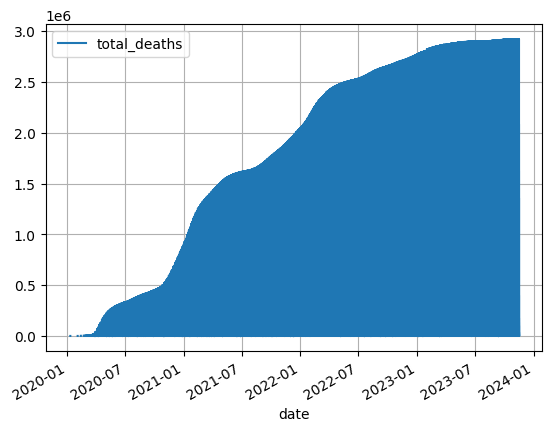

In [76]:
df.plot(x='date',
               y='total_deaths',
               kind='line',
               grid=True,
              )
plt.show()

<ipython-input-37-8a4009e82ac2>:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


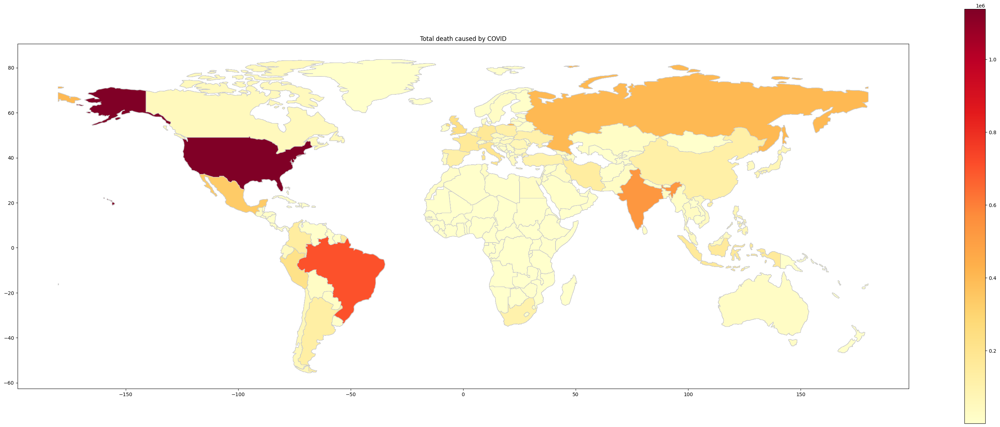

In [37]:
import geopandas as gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


merged_data = world.merge(df[["iso_code", "total_deaths"]], left_on='iso_a3', right_on='iso_code', how='left')
fig, ax = plt.subplots(figsize=(40, 15))
merged_data.plot(column='total_deaths', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
plt.title("Total death caused by COVID")
plt.show()

<Axes: xlabel='continent', ylabel='human_development_index'>

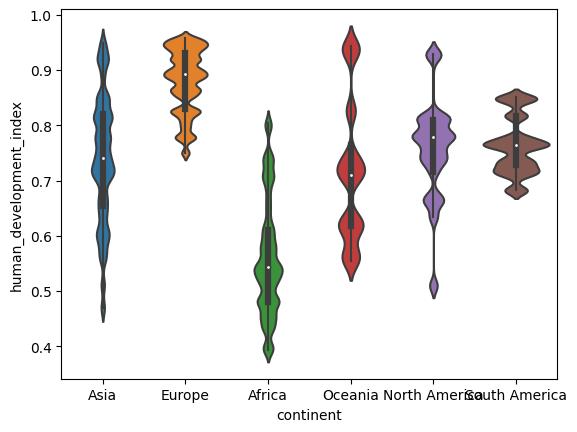

In [38]:
sns.violinplot(x=df['continent'], y=df['human_development_index'])

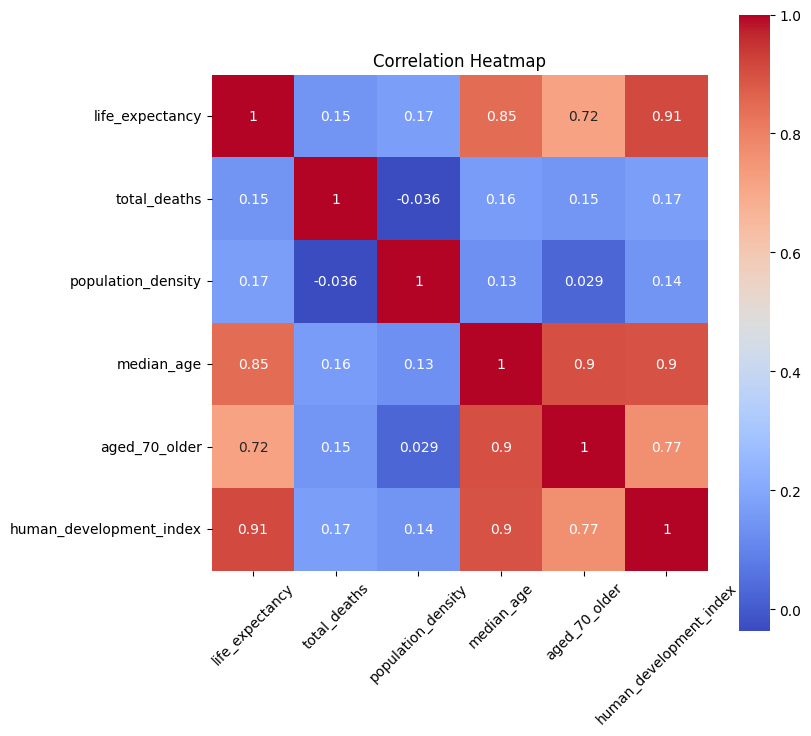

In [39]:
columns = ['life_expectancy', 'total_deaths', 'population_density', 'median_age', 'aged_70_older', 'human_development_index']
selected_data = df[columns]

# Drop rows with missing values
selected_data = selected_data.dropna()

# Calculate the correlation matrix
corr_matrix = selected_data.corr()

# Generate the heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# Customize plot labels and title
plt.title('Correlation Heatmap')
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Show the plot
plt.show()

In [40]:
tmp = df.groupby('location')
tmp["reproduction_rate"].max().sort_values(ascending=False).head(10)

location
South Korea      5.87
Iran             4.82
Turkey           4.25
Philippines      4.22
Japan            4.08
Eswatini         4.00
China            3.68
Malta            3.62
United States    3.61
Italy            3.54
Name: reproduction_rate, dtype: float64

In [98]:
tmp = df.groupby('continent')
tmp["population_density"].max().sort_values(ascending=False).head(10)

continent
Asia             20546.766
Europe           19347.500
North America     1308.820
Oceania            682.450
Africa             622.962
South America       66.939
Name: population_density, dtype: float64

In [96]:
import plotly.express as px

fig = px.line_polar(df, r='reproduction_rate', theta='continent', line_close=True)
fig.show()

fig = px.line_polar(df, r='population_density', theta='continent', line_close=True)
fig.show()

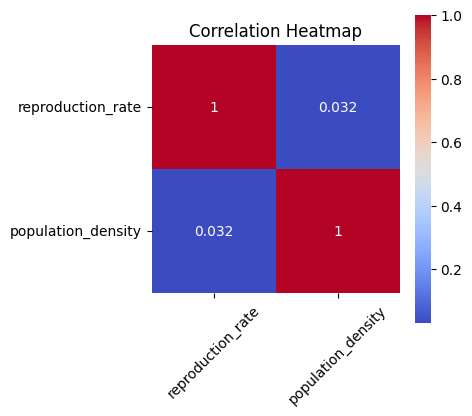

In [100]:
columns = ['reproduction_rate','population_density']
selected_data = df[columns]

# Drop rows with missing values
selected_data = selected_data.dropna()

# Calculate the correlation matrix
corr_matrix = selected_data.corr()

# Generate the heatmap
plt.figure(figsize=(4, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# Customize plot labels and title
plt.title('Correlation Heatmap')
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Show the plot
plt.show()

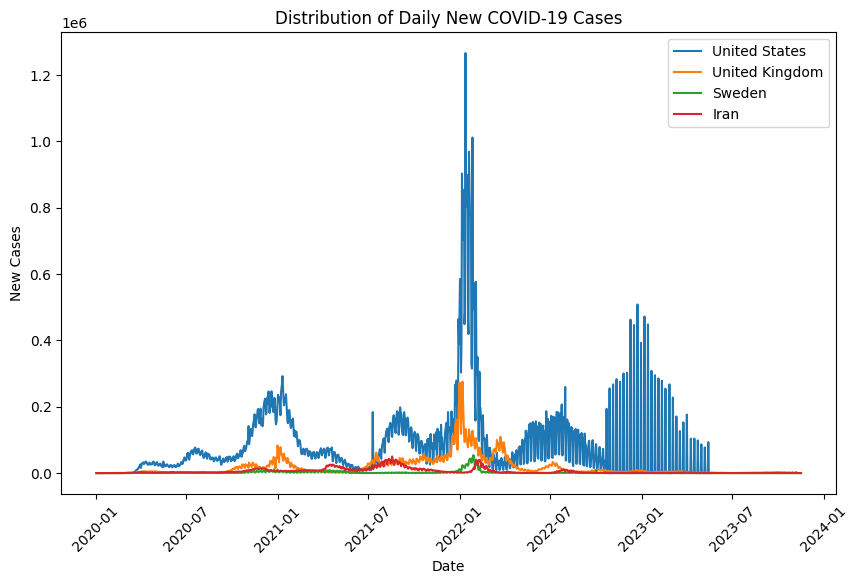

In [81]:
# Select the countries you want to compare
countries = ['United States', 'United Kingdom', 'Sweden', 'Iran']

# Create a dictionary to store the data for each country
country_data = {}
for country in countries:
    country_data[country] = df[df['location'] == country]

# Plot the distribution of daily new cases over time for each country
plt.figure(figsize=(10, 6))
for country in countries:
    date = pd.to_datetime(country_data[country]['date'])
    new_cases = country_data[country]['new_cases']
    plt.plot(date, new_cases, label=country)

plt.xlabel('Date')
plt.ylabel('New Cases')
plt.title('Distribution of Daily New COVID-19 Cases')
plt.xticks(rotation=45)
plt.legend()
plt.show()

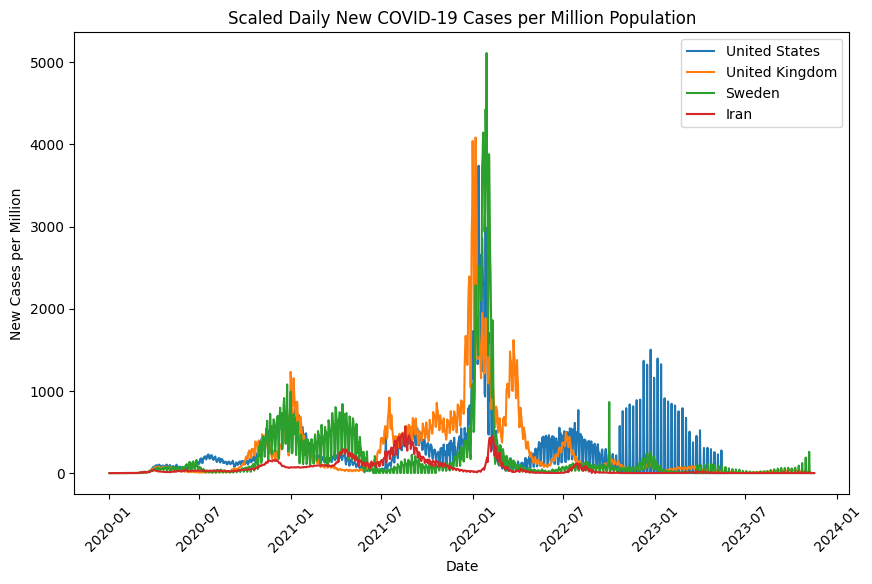

In [90]:
# Create a dictionary to store the data for each country
country_data = {}
for country in countries:
    country_data[country] = df[df['location'] == country]

# Plot the scaled new cases per population over time for each country
plt.figure(figsize=(10, 6))
for country in countries:
    date = pd.to_datetime(country_data[country]['date'])
    new_cases = country_data[country]['new_cases']
    population = country_data[country]['population']
    scaled_new_cases = new_cases / population * 1000000  # Scale to per million
    plt.plot(date, scaled_new_cases, label=country)

plt.xlabel('Date')
plt.ylabel('New Cases per Million')
plt.title('Scaled Daily New COVID-19 Cases per Million Population')
plt.xticks(rotation=45)
plt.legend()
plt.show()

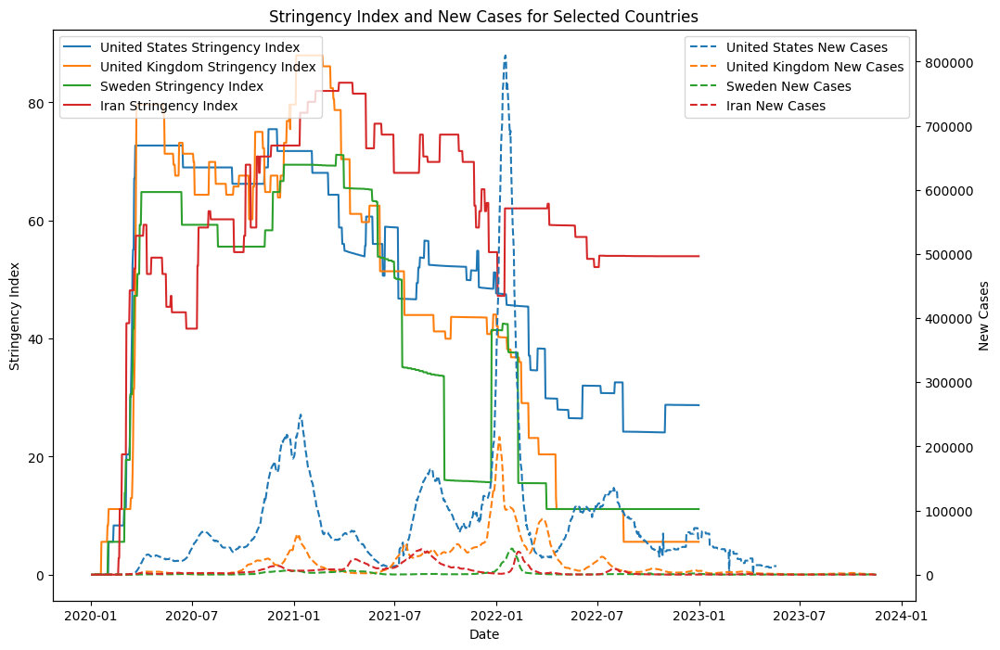

In [92]:
df_countries = df[df['location'].isin(countries)]
fig, ax1 = plt.subplots(figsize=(12, 8))

# Plotting stringency index for each country
for country in countries:
    df_country = df_countries[df_countries['location'] == country]
    ax1.plot(df_country['date'], df_country['stringency_index'], label=country + ' Stringency Index')

# Set the y-axis label for stringency index
ax1.set_ylabel('Stringency Index')

# Creating a second y-axis for new cases
ax2 = ax1.twinx()

# Plotting new cases for each country
for country in countries:
    df_country = df_countries[df_countries['location'] == country]
    ax2.plot(df_country['date'], df_country['new_cases_smoothed'], linestyle='--', label=country + ' New Cases')

# Set the y-axis label for new cases
ax2.set_ylabel('New Cases')

# Set the x-axis label and title
ax1.set_xlabel('Date')
ax1.set_title('Stringency Index and New Cases for Selected Countries')

# Display the legend
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Show the plot
plt.show()

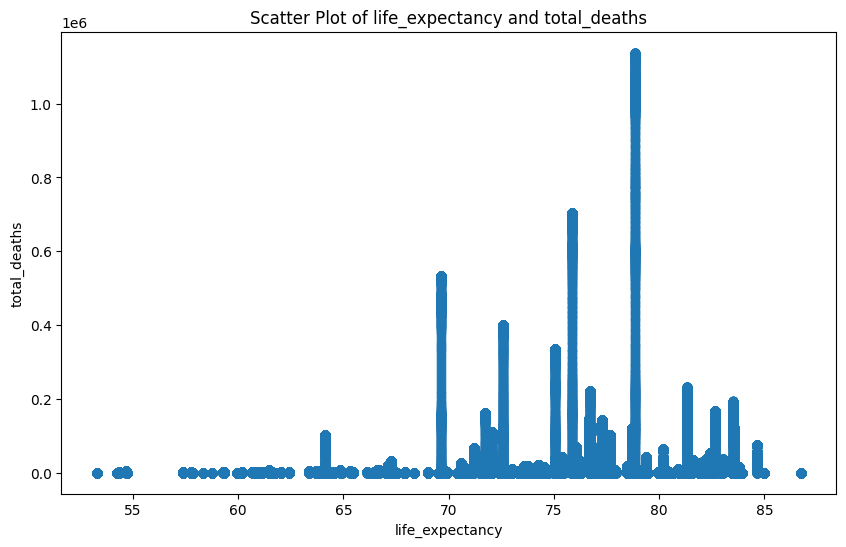

In [108]:
plt.figure(figsize=(10, 6))

plt.scatter(df['life_expectancy'], df['total_deaths'], alpha=0.5)

# Set the x-axis label and title
plt.xlabel('life_expectancy')
plt.ylabel('total_deaths')
plt.title('Scatter Plot of life_expectancy and total_deaths')

# Show the plot
plt.show()

In [109]:
columns = ['total_deaths','life_expectancy']
selected_data = df[columns]

corr_matrix = selected_data.corr()
print(corr_matrix)

                 total_deaths  life_expectancy
total_deaths         1.000000         0.096632
life_expectancy      0.096632         1.000000


<ipython-input-112-599559c9bc25>:2: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



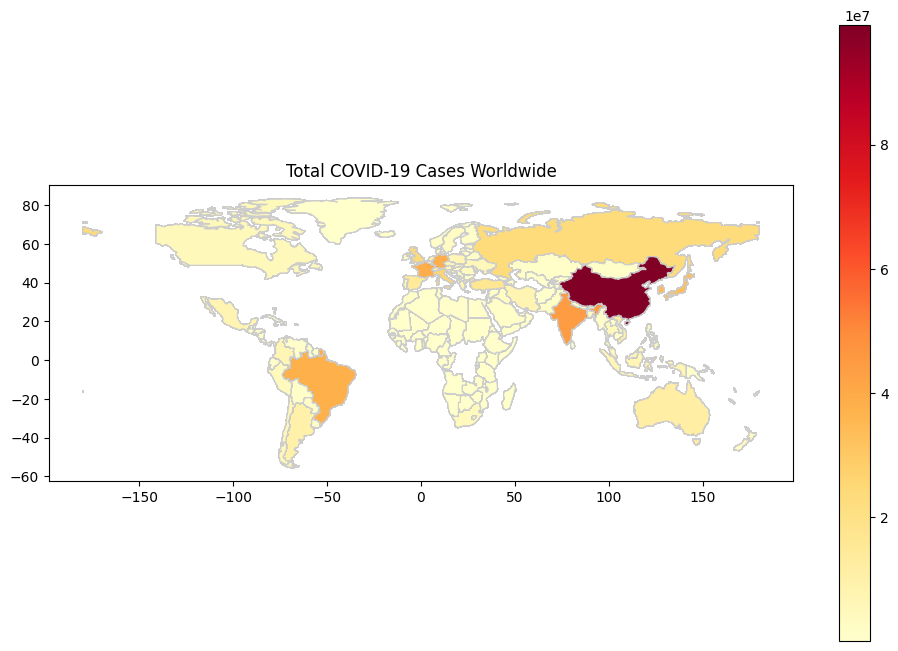

In [112]:
# Load the world shapefile for mapping
world_map = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Merge the OWID data with the world map data
merged_data = world_map.merge(df, left_on='name', right_on='location')

# Plot the total number of COVID-19 cases on a global map
fig, ax = plt.subplots(figsize=(12, 8))
merged_data.plot(column='total_cases', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_title('Total COVID-19 Cases Worldwide')
plt.show()